In [36]:
%pip install matplotlib seaborn
%pip install scipy

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [37]:
# Imports necesarios para el notebook
from random import seed

from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np
import scipy as sp
import sys
import os

from util import time_algorithm

sys.path.append(os.path.abspath(".."))
from problema_2 import algoritmo_greedy
# Siempre seteamos la seed de aleatoridad para que los # resultados sean reproducibles
seed(12345)
np.random.seed(12345)

sns.set_theme()


# Medicion

Creamos un arreglo que va a tener los numeros 50000, 10000, 150000, 200000, 250000 y lo evaluaremos en el algoritmo desarrollado.

In [38]:
def get_random_array(size: int, low=-50_000, high=50_000):
    return np.random.randint(low, high + 1, size)

# La variable x van a ser los valores del eje x de los gráficos en todo el notebook
# Tamaño mínimo=100, tamaño máximo=1kk, cantidad de puntos=20
x = np.linspace(100, 7_500, 20).astype(int)

results = time_algorithm(algoritmo_greedy, x, lambda s: [get_random_array(s)])

{0: np.int64(441704), 1: np.int64(400764), 2: np.int64(357974), 3: np.int64(309562), 4: np.int64(268301), 5: np.int64(299548), 6: np.int64(250835), 7: np.int64(202616), 8: np.int64(190163), 9: np.int64(149347), 10: np.int64(157099), 11: np.int64(156531), 12: np.int64(141873), 13: np.int64(103975), 14: np.int64(123787), 15: np.int64(172155), 16: np.int64(179078), 17: np.int64(140291), 18: np.int64(163057), 19: np.int64(194853), 20: np.int64(214254), 21: np.int64(250170), 22: np.int64(206819), 23: np.int64(204353), 24: np.int64(200462), 25: np.int64(187912), 26: np.int64(154168), 27: np.int64(114835), 28: np.int64(150230), 29: np.int64(175973), 30: np.int64(160796), 31: np.int64(199271), 32: np.int64(218054), 33: np.int64(189080), 34: np.int64(140262), 35: np.int64(135139), 36: np.int64(118107), 37: np.int64(153595), 38: np.int64(104354), 39: np.int64(111951), 40: np.int64(76954), 41: np.int64(49847), 42: np.int64(8090), 43: np.int64(41133), 44: np.int64(-15914), 45: np.int64(13692), 46:

Creamos el grafico que representa el tiempo de ejecucion vs el rango de numeros evaluados.

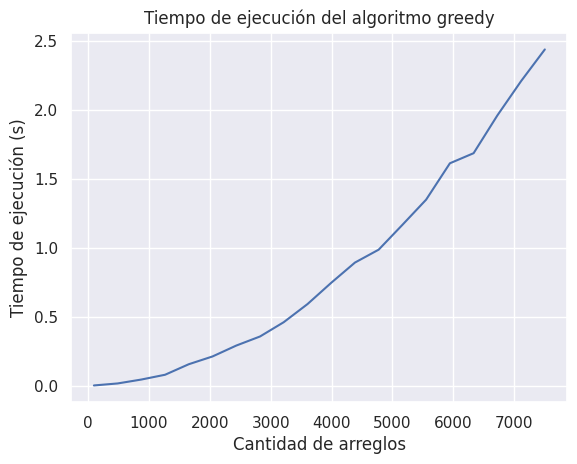

In [ ]:
ax: plt.Axes
fig, ax = plt.subplots()
ax.plot(x, [results[i] for i in x], label="Medición")
ax.set_title('Tiempo de ejecución del algoritmo greedy')
ax.set_xlabel('Tamaño del arreglo')
ax.set_ylabel('Tiempo de ejecución (s)')
None

Calculamos el ajuste por cuadrados mínimos a traves de la biblioteca scipy:

c_1 = 4.1012063300982504e-08, c_2 = 1.6756188118027815e-05
Error cuadrático total: 0.012270807221559231


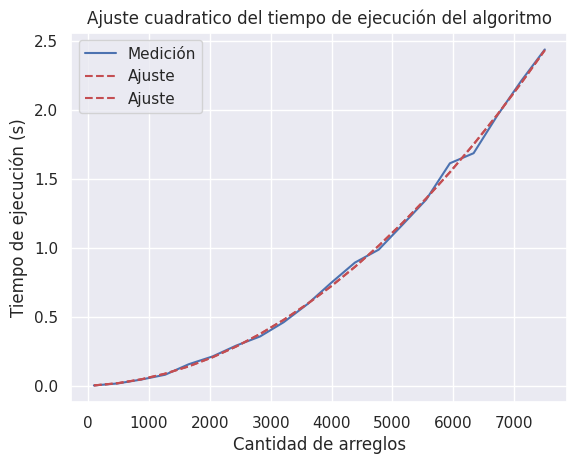

In [49]:
f = lambda x, c1, c2, c3: c1 * x**2 + c2 * x + c3

# Ajuste de parámetros
c, pcov = sp.optimize.curve_fit(f, x, [results[n] for n in x])

print(f"c_1 = {c[0]}, c_2 = {c[1]}")
r = np.sum((f(x, *c) - [results[n] for n in x])**2)
print(f"Error cuadrático total: {r}")

# Graficamos el ajuste
ax.set_title('Ajuste cuadratico del tiempo de ejecución del algoritmo')
ax.plot(x, f(x, *c), 'r--', label="Ajuste")
ax.legend()
fig


Y por ultimo, el error que se comete por cada rango de numeros..

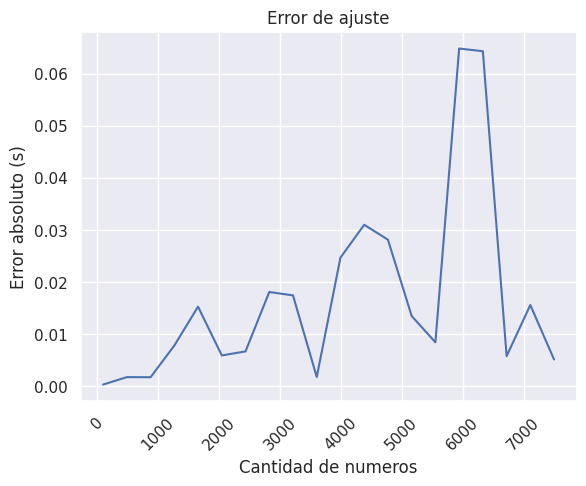

In [41]:
ax: plt.Axes
fig, ax = plt.subplots()
errors = [np.abs(c[0] * (n ** 2) + c[1] * n + c[2] - results[n]) for n in x]
ax.plot(x, errors)
ax.set_title('Error de ajuste')
ax.set_xlabel('Cantidad de numeros')
ax.set_ylabel('Error absoluto (s)')
ax.tick_params(axis='x', rotation=45)

None